In [1]:
!pip install python-Levenshtein

In [2]:
!apt-get install tesseract-ocr-rus

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  tesseract-ocr-rus
0 upgraded, 1 newly installed, 0 to remove and 93 not upgraded.
Need to get 1274 kB of archives.
After this operation, 3877 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 tesseract-ocr-rus all 1:4.00~git30-7274cfa-1 [1274 kB]
Fetched 1274 kB in 1s (1496 kB/s)           
Selecting previously unselected package tesseract-ocr-rus.
(Reading database ... 108827 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-rus_1%3a4.00~git30-7274cfa-1_all.deb ...
Unpacking tesseract-ocr-rus (1:4.00~git30-7274cfa-1) ...
Setting up tesseract-ocr-rus (1:4.00~git30-7274cfa-1) ...


In [3]:
import os
from PIL import Image
import json
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd

import torch
from torch import nn
from torch import utils
from torch.utils.data import DataLoader, Dataset
from torch import optim

import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision import transforms

import easyocr

import Levenshtein

print(torchvision.__version__)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

0.12.0


In [4]:
json.load(open('/kaggle/input/recognition-data/test/0.json', 'rt'))

{'surname': 'ТРАМП', 'name': 'ДОНАЛЬД', 'second_name': 'ДЖОН'}

In [5]:
class PassportDataset(Dataset):
    """ Custom dataset for data representation """
    def __init__(self, data_folder: str):
        self.data_folder = data_folder
        self.json_file_list = [file_name for file_name in os.listdir(data_folder) if '.json' in file_name]
        self.labels_list = [_, 'surname', 'name', 'second_name']
        
    def __getitem__(self, ind: int):
        json_image_path = os.path.normpath(self.data_folder + f'/{self.json_file_list[ind]}')
        json_obj = json.load(open(json_image_path))
        
        # Load image
        try:
            img = Image.open(os.path.normpath(self.data_folder + f'/{self.json_file_list[ind][:-5] + ".jpeg"}')).convert("RGB")
        except OSError:
            img = Image.open(os.path.normpath(self.data_folder + f'/{self.json_file_list[ind][:-5] + ".png"}')).convert("RGB")
        
        
        return img, json_obj
    
    def __len__(self):
        return len(self.json_file_list)

{'surname': 'ШАПОШНИКОВА', 'name': 'ВИКТОРИЯ', 'second_name': 'НИКОЛАЕВНА'}


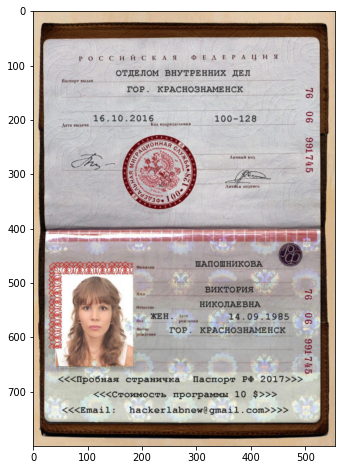

In [6]:
test_ds = PassportDataset('../input/recognition-data/test/')
plt.figure(figsize=(12, 8))
plt.imshow(test_ds[1][0])
print(test_ds[1][1])

In [7]:
import pickle
model = pickle.load(open('/kaggle/input/ocrmodel/trained_model_49_06_1670316569', mode='rb'))
easy_reader = easyocr.Reader(['ru'], gpu=True, model_storage_directory='./OCR model/')

Progress: |██████████████████████████████████████████████████| 100.1% Complete

In [8]:
def collate_fn(batch):
    return tuple(zip(*batch))

def show_model_prediction(model: nn.Module, dataset: PassportDataset):
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=4, num_workers=2, shuffle=True, collate_fn=collate_fn)
    
    img_count = len(dataset)
    
    fig, axes = plt.subplots(img_count, 2, gridspec_kw={'width_ratios': [4, 1]}, figsize=(24, img_count * 20))
    
    model.eval()
    
    img_convert = transforms.ToTensor()
    
    plt_ind = 0
    
    for img_batch, target_batch in data_loader:        
        prep_img_batch = list((img_convert(img).to(device) for img in img_batch))        
        
        outputs = model(prep_img_batch)

        
        ##########################
        for temp_image, mod_answer, target in zip(img_batch, outputs, target_batch):

            kept_ind = torchvision.ops.nms(mod_answer['boxes'], mod_answer['scores'], 0.4)            
            
            mod_answer['boxes'] = mod_answer['boxes'][kept_ind]
            mod_answer['labels'] = mod_answer['labels'][kept_ind]
            mod_answer['scores'] = mod_answer['scores'][kept_ind]
            
            conf_ans_ind = mod_answer['scores'] >= 0.65
            
            mod_answer['boxes'] = mod_answer['boxes'][conf_ans_ind]
            mod_answer['labels'] = mod_answer['labels'][conf_ans_ind]
            mod_answer['scores'] = mod_answer['scores'][conf_ans_ind]
            
#             mod_answer = mod_answer[list(np.array(kept_ind.cpu()))]
            

            temp_image = np.array(temp_image)
            # Convert RGB to BGR 
            temp_image = temp_image[:, :, ::-1].copy()

            for box_ind, (box, label) in enumerate(zip(mod_answer['boxes'], mod_answer['labels']), 1):
                # unpack the bounding box
                x0 = int(box[0])
                y0 = int(box[1])
                x1 = int(box[2])
                y1 = int(box[3])
                

                cv2.rectangle(temp_image, (x0, y0), (x1, y1), (0, 0, 255), 1)
                cv2.putText(temp_image, str(box_ind), ((x0 + x1) // 2, (y0 + y1) // 2), 
                            cv2.FONT_HERSHEY_COMPLEX, 0.6, (0, 255, 0))
                
                cropped_image = temp_image[y0: y1, x0: x1]

                recognized_text = (''.join([item[1] for item in easy_reader.readtext(cropped_image)])).upper()
                
                leven_dist = Levenshtein.distance(target[dataset.labels_list[label]], recognized_text)
                
                axes[plt_ind, 1].text(0, 1 - box_ind / len(mod_answer['boxes']), 
                                      f'{box_ind} -> {recognized_text} LD({leven_dist})', fontsize=15, transform=axes[plt_ind, 1].transAxes)
                

            img_obj = cv2.cvtColor(temp_image, cv2.COLOR_BGR2RGB)

            img_width, img_height, _ = img_obj.shape

            cv2.resize(img_obj, (int(3 * img_width), int(3 * img_height)))

            axes[plt_ind, 0].imshow(img_obj)
            axes[plt_ind, 1].axis('off')
            plt_ind += 1
        
    plt.show()

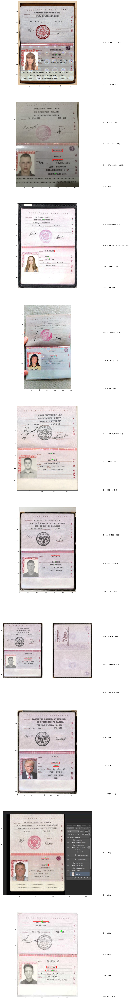

CPU times: user 9.26 s, sys: 1.14 s, total: 10.4 s
Wall time: 14.7 s


In [9]:
%%time
show_model_prediction(model.to(device), test_ds)